In [1]:
import os
os.chdir(path='../')

import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


import STForte.helper as stfhelper
from STForte import STForteModel


from bokeh.themes import Theme
from bokeh.models import ColumnDataSource, LabelSet
from bokeh.layouts import column, row
from bokeh.plotting import curdoc, figure, show
from bokeh.transform import factor_cmap
from bokeh.io import output_notebook, export_svg
output_notebook()


sc.set_figure_params(dpi=120, transparent=True, dpi_save=300, frameon=False, vector_friendly=False, format="pdf", fontsize=24)
trial_name = "trial-Visium_FFPE_Human_Prostate_Cancer"
data_name = "Visium_FFPE_Human_Prostate_Cancer"
plot_dir = f"./{trial_name}/plots"
if not os.path.exists(plot_dir):
    os.makedirs(plot_dir)
sc.settings.figdir = plot_dir
plt.rcParams['font.sans-serif'] = [
    'Helvetica',
    'Arial',
    'sans-serif',]
palette = px.colors.qualitative.Plotly

import plotly.io as pio
pio.kaleido.scope.mathjax = None

Global seed set to 0


Loading BokehJS ...

In [2]:
adata = sc.read_h5ad(f"./{trial_name}/outputs/stforte.h5ad")
adata

AnnData object with n_obs × n_vars = 4371 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'STForte_Mask', 'leiden', 'region_refined'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'leiden', 'leiden_color_map', 'leiden_colors', 'neighbors', 'spatial', 'umap'
    obsm: 'STForte_ATTR', 'STForte_COMB', 'STForte_TOPO', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

In [3]:
from sklearn.metrics import silhouette_score
elbow_res = np.arange(0.1, 1.0 + 0.05, 0.05)
df_elbow = dict()
df_nclust = dict()
for rep_name in ["STForte_ATTR", "STForte_TOPO", "STForte_COMB"]:
    sc.pp.neighbors(adata, use_rep=rep_name)
    ss_elbow = []
    n_clust = []
    for res in elbow_res:
        labels = sc.tl.leiden(adata, resolution=res, copy=True).obs["leiden"]
        ss_elbow.append(silhouette_score(adata.obsm[rep_name], labels))
        n_clust.append(len(labels.cat.categories))
    df_elbow[rep_name] = ss_elbow
    df_nclust[rep_name] = n_clust

In [4]:
import pandas as pd
df_elbow = pd.DataFrame(df_elbow)
df_elbow["resolution"] = elbow_res
df_nclust = pd.DataFrame(df_nclust)
df_nclust["resolution"] = elbow_res

In [5]:
df_nclust

,STForte_ATTR,STForte_TOPO,STForte_COMB,resolution
0,6,5,4,0.10
1,7,6,6,0.15
2,9,8,9,0.20
3,9,10,9,0.25
4,11,10,10,0.30
5,12,12,10,0.35
6,13,13,12,0.40
7,14,13,12,0.45
8,17,14,13,0.50
9,15,15,13,0.55


In [6]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=1, cols=1)
rep_show = {"STForte_ATTR": "ATTR", "STForte_TOPO": "TOPO", "STForte_COMB": "COMB"}
rep_color = {"STForte_ATTR": "#1B9E77", "STForte_TOPO": "#D95F02", "STForte_COMB": "#4a4a4a"}
for rep_name in ["STForte_ATTR", "STForte_TOPO", "STForte_COMB"]:
    fig.add_trace(
        go.Scatter(x=elbow_res, y=np.asarray(df_elbow[rep_name]), name=rep_show[rep_name],
                   line=dict(color=rep_color[rep_name], width=2),),
        row=1, col=1,
    )
fig.update_yaxes(title="Silhouette Coefficient (SC)", title_standoff=0, row=1)
fig.update_layout(legend=dict(
    title="Method:",
    orientation="h",
    entrywidth=70,
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
# Add ref line
# Adding annotations
for rep_name in ["STForte_ATTR", "STForte_TOPO", "STForte_COMB",]:
    ss_max_ind = np.argmax(df_elbow[rep_name])
    res_max = df_elbow["resolution"][ss_max_ind]
    ss_max = df_elbow[rep_name][ss_max_ind]
    nclust_max = df_nclust[rep_name][ss_max_ind]
    fig.add_annotation(
            x=res_max,
            y=ss_max,
            xref="x",
            yref="y",
            text=f"{rep_show[rep_name]} (#Clust = {nclust_max}, SC = {ss_max:.2f})",
            showarrow=True,
            font=dict(
                family="Arial",
                size=14,
                color="#ffffff"
                ),
            align="right",
            arrowhead=2,
            arrowsize=1,
            arrowwidth=2,
            arrowcolor="#434343",
            ax=50 if rep_name != "STForte_COMB" else 60,
            ay=-25 if rep_name == "STForte_ATTR" else 25 if rep_name=="STForte_COMB" else -30,
            bordercolor="#434343",
            borderwidth=1,
            borderpad=3,
            bgcolor=rep_color[rep_name],
            opacity=0.7,
            row=1, col=1,
            )
    fig.add_vline(x=res_max, line_dash="dash", line_width=1, 
                  annotation_text=f"{res_max:.2f}",
                  annotation_position="bottom right",
                  annotation=dict(textangle=90),
                  row=1, col=1)
fig.update_layout(width=480, height=320, margin=dict(l=10, r=10, t=20, b=10),
                  template="plotly_white",
                  font_family="Arial")
fig.write_image(f"{trial_name}/plots/elbow_embeddings.pdf")
fig.show()

In [7]:
for rep_name in ["STForte_ATTR", "STForte_TOPO", "STForte_COMB",]:
    sc.pp.neighbors(adata, use_rep=rep_name)
    ss_max_ind = np.argmax(df_elbow[rep_name])
    res_max = df_elbow["resolution"][ss_max_ind]
    ss_max = df_elbow[rep_name][ss_max_ind]
    nclust_max = df_nclust[rep_name][ss_max_ind]
    adata.obs[f"leiden_{rep_name}_bestSS"] = sc.tl.leiden(adata, resolution=res_max, copy=True).obs["leiden"]
for lname in [f"leiden_{rep_name}_bestSS" for rep_name in ["STForte_ATTR", "STForte_TOPO", "STForte_COMB",]]:
    adata.obs[lname] = adata.obs[lname].cat.rename_categories(dict(((i, f'C{int(i) + 1}') for i in adata.obs[lname].cat.categories)))
adata

AnnData object with n_obs × n_vars = 4371 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'STForte_Mask', 'leiden', 'region_refined', 'leiden_STForte_ATTR_bestSS', 'leiden_STForte_TOPO_bestSS', 'leiden_STForte_COMB_bestSS'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'leiden', 'leiden_color_map', 'leiden_colors', 'neighbors', 'spatial', 'umap'
    obsm: 'STForte_ATTR', 'STForte_COMB', 'STForte_TOPO', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

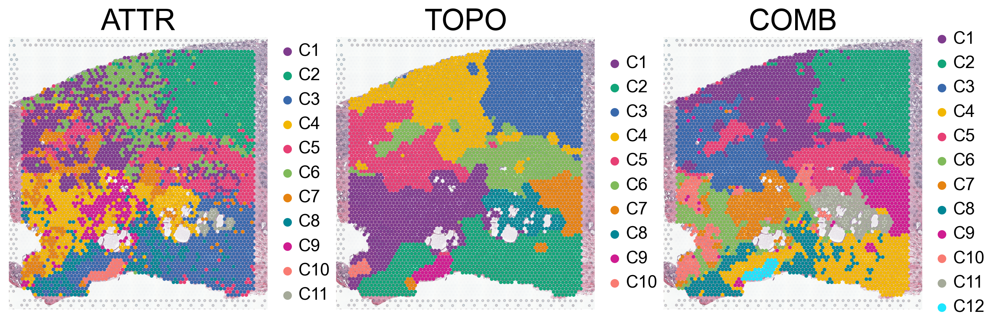

In [8]:
with plt.rc_context():
  sc.pl.spatial(adata, color=[f"leiden_{rep_name}_bestSS" for rep_name in ["STForte_ATTR", "STForte_TOPO", "STForte_COMB",]],
                title=["ATTR", "TOPO", "COMB",],
                size=1.5,
                legend_fontsize=14,
                wspace=.12,
                show=False,
                palette=stfhelper.pl.rgb2hex(px.colors.qualitative.Bold)+[stfhelper.pl.godsnot_102[1]])
  plt.savefig(f"{plot_dir}/compare_embeddings.pdf", bbox_inches="tight", dpi=300)

In [9]:
for rep_name in ["STForte_ATTR", "STForte_TOPO", "STForte_COMB",]:
    sc.pp.neighbors(adata, use_rep=rep_name)
    adata.obsm[f"UMAP_{rep_name}"] = sc.tl.umap(adata, copy=True).obsm['X_umap']

In [10]:
source, p = {}, {}
palette = px.colors.qualitative.Plotly
source[1] = ColumnDataSource(dict(x=adata.obsm[f"UMAP_STForte_ATTR"][:, 0], y=adata.obsm[f"UMAP_STForte_ATTR"][:, 1],
                                leiden=adata.obs["leiden_STForte_ATTR_bestSS"]))
p[1] = figure(title="ATTR", width=480, height=480, toolbar_location=None, match_aspect=True)
p[1].circle(
    'x', 'y', source=source[1],
    fill_color=factor_cmap('leiden', 
                           palette=stfhelper.pl.rgb2hex(px.colors.qualitative.Bold)+[stfhelper.pl.godsnot_102[1]], 
                           factors=adata.obs["leiden_STForte_ATTR_bestSS"].cat.categories),
    angle=.5, size=5, line_color=None
    )
source[2] = ColumnDataSource(dict(x=adata.obsm[f"UMAP_STForte_TOPO"][:, 0], y=adata.obsm[f"UMAP_STForte_TOPO"][:, 1],
                                leiden=adata.obs["leiden_STForte_TOPO_bestSS"]))
p[2] = figure(title="TOPO", width=240, height=240, toolbar_location=None, match_aspect=True)
p[2].circle('x', 'y', source=source[2],
            fill_color=factor_cmap('leiden', 
                                   palette=stfhelper.pl.rgb2hex(px.colors.qualitative.Bold)+[stfhelper.pl.godsnot_102[1]], 
                                   factors=adata.obs["leiden_STForte_TOPO_bestSS"].cat.categories),
          angle=.5, size=4, line_color=None,)
source[3] = ColumnDataSource(dict(x=adata.obsm[f"UMAP_STForte_COMB"][:, 0], y=adata.obsm[f"UMAP_STForte_COMB"][:, 1],
                                leiden=adata.obs["leiden_STForte_COMB_bestSS"]))
p[3] = figure(title="COMB", width=240, height=240, toolbar_location=None, match_aspect=True)
p[3].hex('x', 'y', source=source[3],
          fill_color=factor_cmap('leiden', 
                                 palette=stfhelper.pl.rgb2hex(px.colors.qualitative.Bold)+[stfhelper.pl.godsnot_102[1]],  
                                 factors=adata.obs["leiden_STForte_COMB_bestSS"].cat.categories),
          angle=.5, size=4, line_color=None,)
for k in p.keys():
    l = stfhelper.pl.layout_centroid_label(source[k], "leiden", font_size=22 if k==1 else 14)
    p[k].add_layout(l)
    p[k].axis.visible = False
    p[k].grid.visible = False
    p[k].title.align = "center"
    p[k].title.text_font = "Arial"
    p[k].outline_line_color = None
p[1].title.text_font_size = '28pt'
p[2].title.text_font_size = '20pt'
p[3].title.text_font_size = '20pt'
grid = row(p[1], column(p[2], p[3]))
show(grid)

In [11]:
for k in p.keys():
    p[k].output_backend = "svg"
export_svg(grid, filename=f"{trial_name}/plots/umap_embeddings.svg")

['trial-Visium_FFPE_Human_Prostate_Cancer_pca/plots/umap_embeddings.svg']

In [12]:
adata_sp = sc.read_h5ad(f"./{trial_name}/outputs/sp.h5ad")
adata_sp

AnnData object with n_obs × n_vars = 17040 × 300
    obs: 'spot_instance', 'leiden_with_padding', 'region_refined_padding'
    uns: 'leiden_with_padding_color_map', 'leiden_with_padding_colors', 'neighbors', 'umap'
    obsm: 'SP_ATTR_FP', 'SP_COMB', 'SP_TOPO', 'X_umap', 'spatial'
    obsp: 'A_STForte_conn', 'A_STForte_recon', 'connectivities', 'distances'

In [13]:
base_label = "leiden_STForte_ATTR_bestSS"
for key in ["SP_TOPO", "SP_ATTR_FP", "SP_COMB"]:
    adata_sp.obs[f"{base_label}_pad_{key}"] = stfhelper.annotation_propagate(adata_sp, base_label, adata, latent_embed=key, copy=True)
    adata_sp.obs[f"{base_label}_pad_{key}"] = adata_sp.obs[f"{base_label}_pad_{key}"].cat.reorder_categories([f"C{ii+1}" for ii in range(11)])

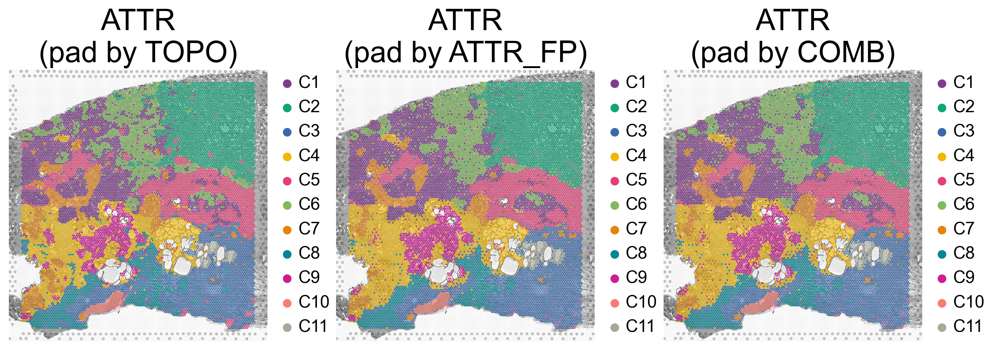

In [14]:
with plt.rc_context():
  sc.pl.spatial(adata_sp, size=0.625, bw=True,
                color=[f'{base_label}_pad_SP_TOPO', f'{base_label}_pad_SP_ATTR_FP', f'{base_label}_pad_SP_COMB'], 
                title=[f'ATTR\n(pad by TOPO)', f'ATTR\n(pad by ATTR_FP)', f'ATTR\n(pad by COMB)'],
                palette=stfhelper.pl.rgb2hex(px.colors.qualitative.Bold)+[stfhelper.pl.godsnot_102[1]],
                frameon=False,
                legend_fontsize=14,
                wspace=.12,
                img=adata.uns['spatial'][data_name]['images']['hires'],
                spot_size=adata.uns['spatial'][data_name]['scalefactors']['spot_diameter_fullres'], 
                scale_factor=adata.uns['spatial'][data_name]['scalefactors']['tissue_hires_scalef'],
                show=False,
                )
  plt.savefig(f"{plot_dir}/show_sp_embeddings.pdf", bbox_inches="tight", dpi=300)

In [15]:
for key in ["SP_ATTR_FP", "SP_TOPO", "SP_COMB"]:
    sc.pp.neighbors(adata_sp, use_rep=f"{key}", key_added=f"CONN_{key}")
for key in ["SP_ATTR_FP", "SP_TOPO", "SP_COMB"]:
    adata_sp.obsm[f"{key}_umap"] = sc.tl.umap(adata_sp, neighbors_key=f"CONN_{key}", copy=True).obsm['X_umap']

In [16]:
fig = make_subplots(cols=3, rows=1)
for ii, key in enumerate(["SP_TOPO", "SP_ATTR_FP", "SP_COMB"]):
    for jj, cc in enumerate(adata_sp.obs[f"{base_label}_pad_{key}"].cat.categories):
        fig.add_trace(
            go.Scatter(
                x=adata_sp[adata_sp.obs[f"{base_label}_pad_{key}"]==cc].obsm[f"{key}_umap"][:, 0],
                y=adata_sp[adata_sp.obs[f"{base_label}_pad_{key}"]==cc].obsm[f"{key}_umap"][:, 1],
                mode="markers",
                marker_color=adata_sp.uns[f'{base_label}_pad_{key}_colors'][jj],
                marker_size=1.5,
            ),
            row=1, col=ii+1
        )
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)
fig.update_layout(template="none", showlegend=False, margin=dict(l=10, r=10, b=10, t=10),
                  width=600, height=200)
fig.write_image(f"{plot_dir}/umap_sp_pad_compare.pdf", width=600, height=200)
fig.show()

In [17]:
fig = make_subplots(cols=3, rows=1)
for ii, key in enumerate(["SP_TOPO", "SP_ATTR_FP", "SP_COMB"]):
    for jj, cc in enumerate(adata_sp.obs[f"spot_instance"].cat.categories):
        fig.add_trace(
            go.Scatter(
                x=adata_sp[adata_sp.obs[f"spot_instance"]==cc].obsm[f"{key}_umap"][:, 0],
                y=adata_sp[adata_sp.obs[f"spot_instance"]==cc].obsm[f"{key}_umap"][:, 1],
                mode="markers",
                marker_color=stfhelper.pl.iwanthue_alphabet_hard[jj],
                name=cc,
                marker_size=1.5,
                showlegend=False if ii != 0 else True,
            ),
            row=1, col=ii+1
        )
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)
fig.update_layout(template="none", legend=dict(orientation="h",
    entrywidth=70,
    yanchor="bottom",
    y=-0.2,
    xanchor="center",
    x=0.5,
    itemsizing='constant'),
     margin=dict(l=10, r=10, b=10, t=10),
    width=600, height=200)
fig.write_image(f"{plot_dir}/umap_sp_instance_compare.pdf", width=600, height=200)
fig.show()